<a href="https://colab.research.google.com/github/guebin/DV2023/blob/main/posts/12wk-1-1.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" style="text-align: left"></a>

# 1. 강의영상 

{{<video https://youtu.be/playlist?list=PLQqh36zP38-wFUcEr7JtSb7MWUYl6QrW_&si=CmWA765p0mnwWTGA >}}

# 2. Imports 

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.io as pio

In [2]:
pd.options.plotting.backend = "plotly"
pio.templates.default = "plotly_white"

# 3. 예비학습: 뉴욕 

## A. 뉴욕의 주요명소 

In [3]:
# 뉴욕의 주요 명소 및 위치를 데이터프레임으로 생성
nyc_landmarks = {
    "Name": ["Wall Street", "Midtown Manhattan", "Times Square", 
             "Central Park", "Statue of Liberty", "Forest Park", "Citi Field"],
    "Latitude": [40.7074, 40.7549, 40.7580, 40.785091, 40.6892, 40.7028, 40.7571],
    "Longitude": [-74.0113, -73.9840, -73.9855, -73.968285, -74.0445, -73.8495, -73.8458]
}

df_nyc_landmarks = pd.DataFrame(nyc_landmarks)
df_nyc_landmarks

,Name,Latitude,Longitude
0,Wall Street,40.707400,-74.011300
1,Midtown Manhattan,40.754900,-73.984000
2,Times Square,40.758000,-73.985500
3,Central Park,40.785091,-73.968285
4,Statue of Liberty,40.689200,-74.044500
5,Forest Park,40.702800,-73.849500
6,Citi Field,40.757100,-73.845800


## B. 시각화 

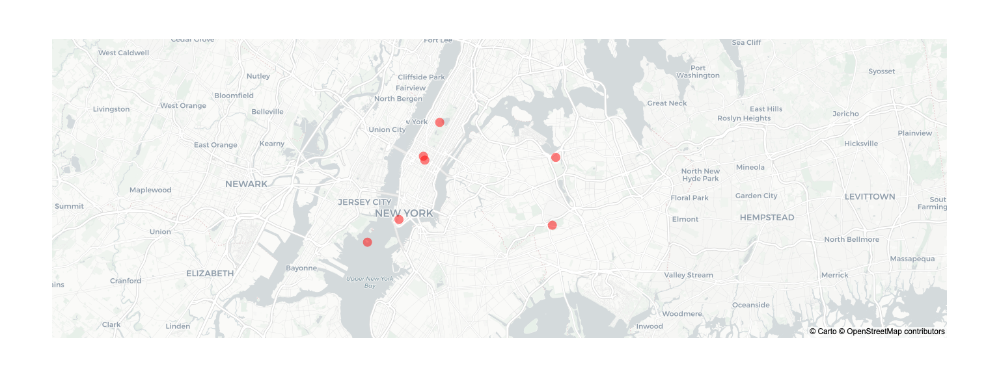

In [4]:
fig = px.scatter_mapbox(
    data_frame=df_nyc_landmarks,
    lat='Latitude',
    lon='Longitude',
    center={'lat': 40.7322, 'lon': -73.9052},
    hover_data='Name',
    #---#
    mapbox_style='carto-positron',
    zoom=10,
    width=750,
    height=600
)
fig.update_traces(
    marker={
        'size':15,
        'color':'red',
        'opacity':0.5
    }
)
fig.show(config={'scrollZoom': False})

## C. ChatGPT 설명 

:::{.call-out}
### ChatGPT

뉴욕은 세계에서 가장 중요한 금융 및 문화 중심지 중 하나로, 금융권 밀집 지역과 유명한 관광 명소가 많습니다. 다음은 뉴욕의 대표적인 금융권 밀집 지역과 주요 관광 명소 중 일부입니다:

***금융권 밀집 지역***

1. **월스트리트 (Wall Street)**: 
   - 월스트리트는 세계 금융의 상징이며, 뉴욕증권거래소(NYSE)와 많은 은행 및 금융 기관의 본사가 위치해 있습니다.
   - 이 지역은 글로벌 금융 및 경제의 중심지로 간주되며, '월스트리트'는 종종 미국 금융 산업 전체를 지칭하는 용어로 사용됩니다.

2. **미드타운 (Midtown)**:
   - 미드타운 맨해튼은 많은 기업 본사, 유명 호텔, 쇼핑 지역 및 레스토랑이 밀집해 있는 지역입니다.
   - 이 지역에는 국제연합 본부, 메이시스 백화점, 록펠러 센터 등이 위치해 있습니다.

***주요 관광 명소***

1. **타임스퀘어 (Times Square)**:
   - 타임스퀘어는 뉴욕의 상징적인 관광 명소 중 하나로, 번화한 광고판과 네온사인으로 유명합니다.
   - 이곳은 맨해튼의 중심부에 위치하며, 연극과 뮤지컬이 상연되는 브로드웨이 극장가로도 유명합니다.

2. **센트럴 파크 (Central Park)**:
   - 센트럴 파크는 뉴욕 시의 대표적인 공원으로, 도심 속 자연을 즐길 수 있는 아름다운 장소입니다.
   - 공원 내에는 호수, 산책로, 놀이터, 스포츠 시설 등이 마련되어 있으며, 다양한 문화 행사와 공연이 열립니다.

3. **자유의 여신상 (Statue of Liberty)**:
   - 자유의 여신상은 뉴욕 항구에 위치한 미국의 상징적인 조각상입니다.
   - 자유의 여신상은 미국의 자유와 민주주의를 상징하며, 세계적으로 유명한 관광 명소입니다.
   
4. **포레스트 공원 (Forest Park)**: 
   - 이 공원은 뉴욕시 퀸즈 구역에 위치해 있습니다.
   - 포레스트 공원은 약 538 에이커의 면적을 가지고 있으며, 다양한 레크리에이션 활동 및 자연 트레일을 제공합니다.

5. **시티 필드 (Citi Field)**: 
   - 시티 필드는 뉴욕시 퀸즈 구역에 위치한 야구 경기장입니다.
   - 이 경기장은 메이저 리그 야구의 뉴욕 메츠 팀의 홈 구장으로 사용됩니다.
:::

# 4. NYCTaxi 자료

> ref: <https://www.kaggle.com/competitions/nyc-taxi-trip-duration/overview>

## A. 데이터불러오기 

In [5]:
df = pd.read_csv("NYCTaxi.csv")[::100].reset_index(drop=True)
df.columns

Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration'],
      dtype='object')

In [6]:
df.to_csv("NYCTaxi.csv",index=False)

In [7]:
!git add .
!git commit -m .
!git push

[main bb968df] .
 7 files changed, 15981 insertions(+), 1459115 deletions(-)
 rewrite posts/NYCTaxi.csv (99%)
Enumerating objects: 31, done.
Counting objects: 100% (30/30), done.
Delta compression using up to 16 threads
Compressing objects: 100% (23/23), done.
Writing objects: 100% (23/23), 84.07 MiB | 1.02 MiB/s, done.
Total 23 (delta 15), reused 0 (delta 0), pack-reused 0
remote: Resolving deltas: 100% (15/15), completed with 6 local objects.
remote: warning: File posts/11wk-1.ipynb is 50.56 MB; this is larger than GitHub's recommended maximum file size of 50.00 MB
remote: warning: File posts/.ipynb_checkpoints/11wk-2-checkpoint.ipynb is 67.96 MB; this is larger than GitHub's recommended maximum file size of 50.00 MB
remote: warning: File posts/.ipynb_checkpoints/11wk-1-checkpoint.ipynb is 50.56 MB; this is larger than GitHub's recommended maximum file size of 50.00 MB
remote: warning: File posts/11wk-1.ipynb is 50.56 MB; this is larger than GitHub's recommended maximum file size of 

## B. 데이터 설명 

`-` Kaggle의 설명 

- `id`: a unique identifier for each trip
- `vendor_id`: a code indicating the provider associated with the trip record
- `pickup_datetime`: date and time when the meter was engaged
- `dropoff_datetime`: date and time when the meter was disengaged
- `passenger_count`: the number of passengers in the vehicle (driver entered value)
- `pickup_longitude`: the longitude where the meter was engaged
- `pickup_latitude`: the latitude where the meter was engaged
- `dropoff_longitude`: the longitude where the meter was disengaged
- `dropoff_latitude`: the latitude where the meter was disengaged
- `store_and_fwd_flag`: This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server - Y=store and forward; N=not a store and forward trip
- `trip_duration`: duration of the trip in seconds

`-` ChatGPT의 설명: 제공된 자료는 택시 또는 차량 호출 서비스 데이터를 나타내며, 각 트립(여행)에 대한 다양한 정보를 포함하고 있습니다. 이러한 데이터는 주로 택시 회사나 차량 공유 서비스에서 수집되며, 서비스의 효율성 분석, 수요 예측, 지리적 특성 연구 등에 사용됩니다. 각 변수의 설명은 다음과 같습니다:

- `id` (고유 식별자): 각 여행에 대한 고유한 식별 번호입니다. 이를 통해 데이터 내의 각 트립을 구별할 수 있습니다.
- `vendor_id` (공급업체 식별자): 여행 기록과 관련된 서비스 제공업체를 나타내는 코드입니다. 이는 여러 업체가 서비스를 제공하는 경우 구별하는 데 사용됩니다.
- `pickup_datetime` (승차 시간): 승객이 차량에 탑승하고 미터기가 작동하기 시작한 날짜와 시간입니다.
- `dropoff_datetime` (하차 시간): 승객이 차량에서 내리고 미터기가 중단된 날짜와 시간입니다.
- `passenger_count` (승객 수): 차량에 탑승한 승객의 수입니다. 이 값은 운전자가 입력합니다.
- `pickup_longitude` (승차 경도) 및 `pickup_latitude` (승차 위도): 승객이 차량에 탑승한 위치의 경도와 위도입니다.
- `dropoff_longitude` (하차 경도) 및 `dropoff_latitude` (하차 위도): 승객이 차량에서 내린 위치의 경도와 위도입니다.
- `store_and_fwd_flag` (저장 및 전송 플래그): 차량이 서버에 연결되어 있지 않을 때 여행 기록을 차량 메모리에 저장한 후 나중에 전송했는지 여부를 나타냅니다. 'Y'는 저장 후 전송됐음을, 'N'은 실시간 전송됐음을 의미합니다.
- `trip_duration` (여행 기간): 여행의 총 소요 시간으로, 초 단위로 표시됩니다. 이는 승차 시간부터 하차 시간까지의 전체 기간을 나타냅니다.

## C. 변수탐색 및 피처엔지니어링

`-` 시간을 제외하고는 자료들이 잘 정리된 편임 

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14587 entries, 0 to 14586
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  14587 non-null  object 
 1   vendor_id           14587 non-null  int64  
 2   pickup_datetime     14587 non-null  object 
 3   dropoff_datetime    14587 non-null  object 
 4   passenger_count     14587 non-null  int64  
 5   pickup_longitude    14587 non-null  float64
 6   pickup_latitude     14587 non-null  float64
 7   dropoff_longitude   14587 non-null  float64
 8   dropoff_latitude    14587 non-null  float64
 9   store_and_fwd_flag  14587 non-null  object 
 10  trip_duration       14587 non-null  int64  
dtypes: float64(4), int64(3), object(4)
memory usage: 1.2+ MB


`-` `vendor_id`는 비슷한 빈도로 존재함. 

In [7]:
df['vendor_id'].value_counts()

vendor_id
2    7818
1    6769
Name: count, dtype: int64

`-` `trip_duration` 은 너무 큰 값들이 존재함. 

In [8]:
df.plot.hist(x='trip_duration')

## D. 데이터변환 

`-` `trip_duration` 이외에 `log_trip_duration` 추가 

In [9]:
np.log(df.trip_duration).plot.hist() # 정규분포 비슷하게 보임

`-` `pickup_datetime`에서 시간만 추출

In [10]:
df.pickup_datetime.str.split(' ').str[-1].str.split(':').str[0].apply(int) # 방법1

0        17
1        11
2         1
3         6
4        16
         ..
14582    22
14583     8
14584    16
14585    18
14586    17
Name: pickup_datetime, Length: 14587, dtype: int64

In [11]:
df.pickup_datetime.apply(pd.to_datetime).dt.hour # 방법2

0        17
1        11
2         1
3         6
4        16
         ..
14582    22
14583     8
14584    16
14585    18
14586    17
Name: pickup_datetime, Length: 14587, dtype: int32

`-` `pickup_datetime`에서 요일을 추출

In [12]:
df.pickup_datetime.apply(pd.to_datetime).dt.dayofweek # 방법1

0        0
1        2
2        5
3        1
4        5
        ..
14582    0
14583    0
14584    1
14585    0
14586    0
Name: pickup_datetime, Length: 14587, dtype: int32

- 0이 월요일

In [13]:
df.pickup_datetime.apply(pd.to_datetime).dt.strftime('%A') # 방법2

0           Monday
1        Wednesday
2         Saturday
3          Tuesday
4         Saturday
           ...    
14582       Monday
14583       Monday
14584      Tuesday
14585       Monday
14586       Monday
Name: pickup_datetime, Length: 14587, dtype: object

`-` `dropoff_datetime`-`pickup_datetime`룰 계산 + `df.trip_duration` 와 비교

In [14]:
df.dropoff_datetime.apply(pd.to_datetime) - df.pickup_datetime.apply(pd.to_datetime) 

0       0 days 00:07:35
1       0 days 00:30:26
2       0 days 00:03:14
3       0 days 00:21:19
4       0 days 00:34:12
              ...      
14582   0 days 00:15:37
14583   0 days 00:14:45
14584   0 days 00:42:31
14585   0 days 00:17:15
14586   0 days 01:03:41
Length: 14587, dtype: timedelta64[ns]

In [15]:
df.trip_duration # 초단위.. 

0         455
1        1826
2         194
3        1279
4        2052
         ... 
14582     937
14583     885
14584    2551
14585    1035
14586    3821
Name: trip_duration, Length: 14587, dtype: int64

`-` 승차위치와 하차위치를 이용하여 dist를 계산

In [16]:
dist = np.sqrt((df.pickup_latitude-df.dropoff_latitude)**2 + (df.pickup_longitude-df.dropoff_longitude)**2)
dist

0        0.017680
1        0.033027
2        0.008282
3        0.060363
4        0.057778
           ...   
14582    0.035054
14583    0.023886
14584    0.132513
14585    0.023439
14586    0.228013
Length: 14587, dtype: float64

- 사실 이렇게 계산하면 잘못된 계산임 (1) 실제로 최단거리로 차가 이동하지는 않음 / (2) 지구는 둥글어서.. 

In [17]:
dist.plot.hist()

`-` 속력을 계산 

In [18]:
(dist / df.trip_duration).plot.hist()

## E. `df_feature` 생성

In [19]:
df.columns

Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration'],
      dtype='object')

In [20]:
df_feature = df.assign(
    log_trip_duration = np.log(df.trip_duration),
    pickup_datetime = df.pickup_datetime.apply(pd.to_datetime),
    dropoff_datetime = df.dropoff_datetime.apply(pd.to_datetime),
    dist = np.sqrt((df.pickup_latitude-df.dropoff_latitude)**2 + (df.pickup_longitude-df.dropoff_longitude)**2),
    #---#
    vendor_id = df.vendor_id.map({1:'A',2:'B'})
).assign(
    speed = lambda df: df.dist / df.trip_duration,
    pickup_hour = lambda df: df.pickup_datetime.dt.hour,
    dropoff_hour = lambda df: df.dropoff_datetime.dt.hour,
    dayofweek = lambda df: df.pickup_datetime.dt.dayofweek
)

In [21]:
df_feature

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,log_trip_duration,dist,speed,pickup_hour,dropoff_hour,dayofweek
0,id2875421,B,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,6.120297,0.017680,0.000039,17,17,0
1,id3194108,A,2016-06-01 11:48:41,2016-06-01 12:19:07,1,-74.005028,40.746452,-73.972008,40.745781,N,1826,7.509883,0.033027,0.000018,11,12,2
2,id3564028,A,2016-01-02 01:16:42,2016-01-02 01:19:56,1,-73.954132,40.774784,-73.947418,40.779633,N,194,5.267858,0.008282,0.000043,1,1,5
3,id1660823,B,2016-03-01 06:40:18,2016-03-01 07:01:37,5,-73.982140,40.775326,-74.009850,40.721699,N,1279,7.153834,0.060363,0.000047,6,7,1
4,id1575277,B,2016-06-11 16:59:15,2016-06-11 17:33:27,1,-73.999229,40.722881,-73.982880,40.778297,N,2052,7.626570,0.057778,0.000028,16,17,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14582,id3647353,A,2016-05-16 22:12:09,2016-05-16 22:27:46,1,-73.990219,40.737076,-73.986748,40.702194,N,937,6.842683,0.035054,0.000037,22,22,0
14583,id2064944,A,2016-05-23 08:04:35,2016-05-23 08:19:20,1,-73.987068,40.730728,-73.974983,40.751331,N,885,6.785588,0.023886,0.000027,8,8,0
14584,id3286731,B,2016-05-31 16:56:13,2016-05-31 17:38:44,1,-73.863541,40.769711,-73.994644,40.750435,N,2551,7.844241,0.132513,0.000052,16,17,1
14585,id3453691,B,2016-03-07 18:11:54,2016-03-07 18:29:09,1,-74.006531,40.738232,-73.985970,40.726978,N,1035,6.942157,0.023439,0.000023,18,18,0


# 5. 시각화1 -- scatter/density

## A. `scatter_mapbox`

In [22]:
fig = px.scatter_mapbox(
    data_frame=df_feature,
    lat='pickup_latitude',
    lon='pickup_longitude',
    opacity=0.3,
    center={'lat': 40.7322, 'lon': -73.9052},
    mapbox_style='carto-positron',
    zoom=10,
    width=750,
    height=600
)
fig.update_traces(
    marker={'size':2}
)
fig.show(config={'scrollZoom': False})

## B. `density_mapbox`

In [23]:
fig = px.density_mapbox(
    data_frame=df_feature,
    lat = 'pickup_latitude',
    lon = 'pickup_longitude',
    center = {'lat':40.7322, 'lon':-73.9052},
    radius = 1,
    #---#
    mapbox_style='carto-positron',
    zoom=10,
    width=750,
    height=600
)
fig.show(config={'scrollZoom': False})

# 6. 시각화2 -- scatter/density + $\alpha$

## A. density + passenger_count 

In [24]:
fig = px.density_mapbox(
    data_frame=df_feature,
    lat = 'pickup_latitude',
    lon = 'pickup_longitude',
    center = {'lat':40.7322, 'lon':-73.9052},
    radius = 2,
    z='passenger_count',
    #---#
    mapbox_style='carto-positron',
    zoom=10,
    width=750,
    height=600
)
fig.show(config={'scrollZoom': False})

- 단순 밀도와 큰 차이없음. $\to$ 많이 타는 지역에서 단체손님도 더 많이 받을 확률이 높음. 즉 특정지역에서 단체손님이 더 빈번하게 탄다든가? 하는식의 특징은 보이지 않음. 

## B. density + log_trip_duration

In [25]:
fig = px.density_mapbox(
    data_frame=df_feature,
    lat = 'pickup_latitude',
    lon = 'pickup_longitude',
    center = {'lat':40.7322, 'lon':-73.9052},
    radius = 1.5,
    z='log_trip_duration',
    #---#
    mapbox_style='carto-positron',
    zoom=10,
    width=750,
    height=600
)
fig.show(config={'scrollZoom': False})

- 단순 밀도와 큰 차이없음. $\to$ 많이 타는 지역에서 장거리손님도 더 많이 받을 확률이 높음. 즉 특정지역에서 장거리손님이 더 빈번하게 탄다든가? 하는식의 특징은 보이지 않음. 
- 시티필드와 포레스트 공원은 장거리가 좀 많이보이는것 같기도함. 

## C. density + speed 

In [26]:
fig = px.density_mapbox(
    data_frame=df_feature,
    lat = 'pickup_latitude',
    lon = 'pickup_longitude',
    center = {'lat':40.7322, 'lon':-73.9052},
    radius = 2,
    z='speed',
    #---#
    mapbox_style='carto-positron',
    zoom=10,
    width=750,
    height=600
)
fig.show(config={'scrollZoom': False})

- 시티필드나 포레스트공원쪽이 속력이 높아보임

## D. scatter + vendor_id

In [27]:
fig = px.scatter_mapbox(
    data_frame=df_feature,
    lat = 'pickup_latitude',
    lon = 'pickup_longitude',
    opacity = 0.3,
    center = {'lat':40.7322, 'lon':-73.9052},
    color = 'vendor_id',
    #---#
    mapbox_style='carto-positron',
    zoom=10,
    width=750,
    height=600
)
fig.update_traces(
    marker={'size':3}
)
fig.show(config={'scrollZoom': False})

- 뚜렷한 차이점은 보이지 않음 

## E. scatter + dayofweek

In [28]:
fig = px.scatter_mapbox(
    data_frame=df_feature,
    lat = 'pickup_latitude',
    lon = 'pickup_longitude',
    opacity = 0.3,
    center = {'lat':40.7322, 'lon':-73.9052},
    color = 'dayofweek',
    #---#
    mapbox_style='carto-positron',
    zoom=10,
    width=750,
    height=600
)
fig.update_traces(
    marker={'size':2}
)
fig.show(config={'scrollZoom': False})

- 파악하기 어려움 